In [3]:
suppressMessages(library("DESeq2"))
library("ggplot2")
library("RColorBrewer")

In [5]:
countData = read.csv("/home/ecwheele/shared_for_class/counts_for_deseq2.csv",
                    row.names=1)
head(countData)

,u2af1_control_k562_rep1,u2af1_control_k562_rep2,u2af1_shrna_k562_rep1,u2af1_shrna_k562_rep2
ENSG00000223972.4,0,1,0,0
ENSG00000227232.4,94,103,81,36
ENSG00000243485.2,0,1,0,1
ENSG00000237613.2,5,4,5,5
ENSG00000268020.2,0,0,0,0
ENSG00000240361.1,0,0,0,0


In [6]:
colData = read.csv("/home/ecwheele/shared_for_class/conditions_for_deseq2.csv",
                  row.names=1)
head(colData)

,condition
u2af1_control_k562_rep1,control
u2af1_control_k562_rep2,control
u2af1_shrna_k562_rep1,shrna
u2af1_shrna_k562_rep2,shrna


In [8]:
dds = DESeqDataSetFromMatrix(countData = countData, colData = colData,
                            design = ~ condition)
dds

class: DESeqDataSet 
dim: 57820 4 
metadata(0):
assays(1): counts
rownames(57820): ENSG00000223972.4 ENSG00000227232.4 ...
  ENSG00000210195.2 ENSG00000210196.2
rowRanges metadata column names(0):
colnames(4): u2af1_control_k562_rep1 u2af1_control_k562_rep2
  u2af1_shrna_k562_rep1 u2af1_shrna_k562_rep2
colData names(1): condition

In [ ]:
counts(dds)

In [9]:
dds = dds[ rowSums(counts(dds)) > 1, ]
dds

class: DESeqDataSet 
dim: 23299 4 
metadata(0):
assays(1): counts
rownames(23299): ENSG00000227232.4 ENSG00000243485.2 ...
  ENSG00000210195.2 ENSG00000210196.2
rowRanges metadata column names(0):
colnames(4): u2af1_control_k562_rep1 u2af1_control_k562_rep2
  u2af1_shrna_k562_rep1 u2af1_shrna_k562_rep2
colData names(1): condition

In [10]:
dds$condition <- factor(dds$condition, levels=c("control","shrna"))

In [11]:
dds = DESeq(dds)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [13]:
res = results(dds)
res

log2 fold change (MAP): condition shrna vs control 
Wald test p-value: condition shrna vs control 
DataFrame with 23299 rows and 6 columns
                     baseMean log2FoldChange      lfcSE        stat
                    <numeric>      <numeric>  <numeric>   <numeric>
ENSG00000227232.4  76.1035675   -0.271653532 0.26023913 -1.04386122
ENSG00000243485.2   0.4890943    0.006657195 0.06731766  0.09889225
ENSG00000237613.2   4.8078261    0.069471910 0.19248531  0.36092057
ENSG00000238009.2 121.5778665    0.045769530 0.22850775  0.20029749
ENSG00000237683.5 264.0958228   -0.719496925 0.19233161 -3.74091867
...                       ...            ...        ...         ...
ENSG00000198695.2  30805.4132     -0.1926865  0.2509611  -0.7677943
ENSG00000210194.1     46.0356     -0.7519104  0.2683134  -2.8023585
ENSG00000198727.2  31870.5243      0.9556333  0.1065019   8.9729267
ENSG00000210195.2     62.9685      0.1479102  0.2575321   0.5743367
ENSG00000210196.2    362.7238     -0.7977349 

In [15]:
summary(res)


out of 23299 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 1917, 8.2% 
LFC < 0 (down)   : 1671, 7.2% 
outliers [1]     : 0, 0% 
low counts [2]   : 11293, 48% 
(mean count < 24)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [21]:
sum(res$padj < 0.05, na.rm=TRUE)

[1] 2842

In [22]:
res05 <- results(dds, alpha=0.05)
summary(res05)


out of 23299 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 1573, 6.8% 
LFC < 0 (down)   : 1269, 5.4% 
outliers [1]     : 0, 0% 
low counts [2]   : 11293, 48% 
(mean count < 24)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



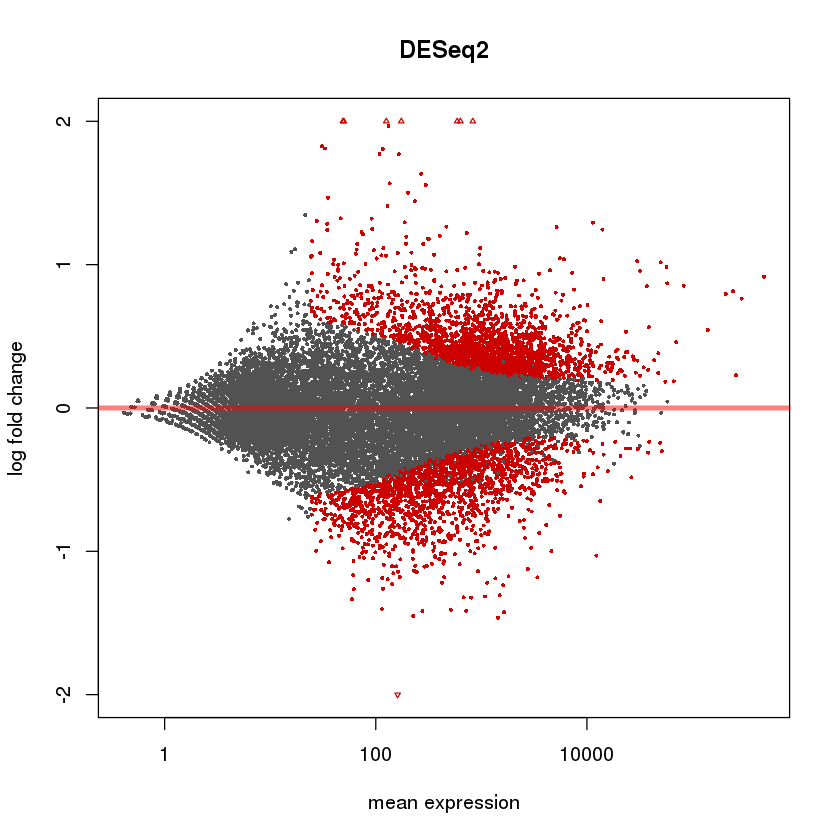

In [23]:
plotMA(res, main="DESeq2", ylim=c(-2,2))

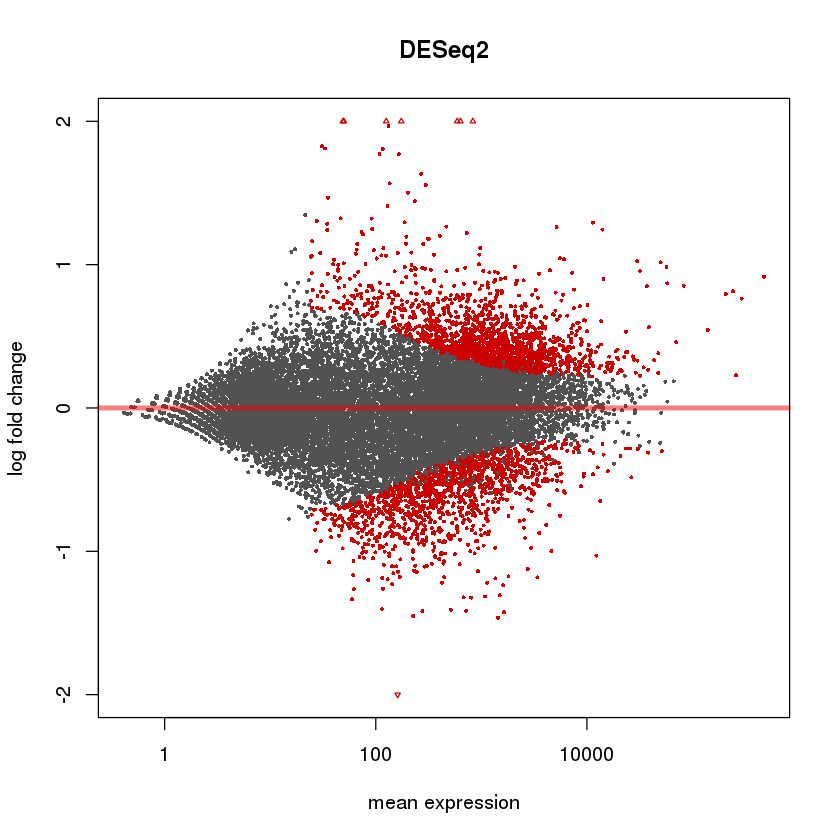

In [24]:
plotMA(res05, main="DESeq2", ylim=c(-2,2))

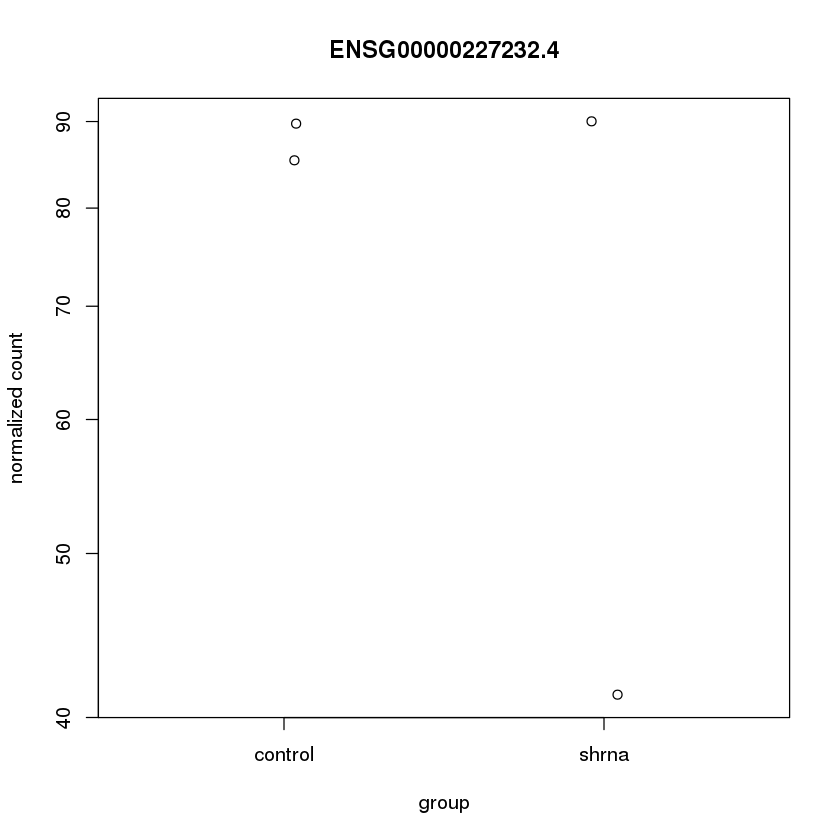

In [27]:
plotCounts(dds, gene="ENSG00000227232.4", intgroup="condition")

In [28]:
write.csv(as.data.frame(res), 
          file="/home/ecwheele/shared_for_class/deseq2_results.csv")

$y
[1] "PC2: 4% variance"

attr(,"class")
[1] "labels"

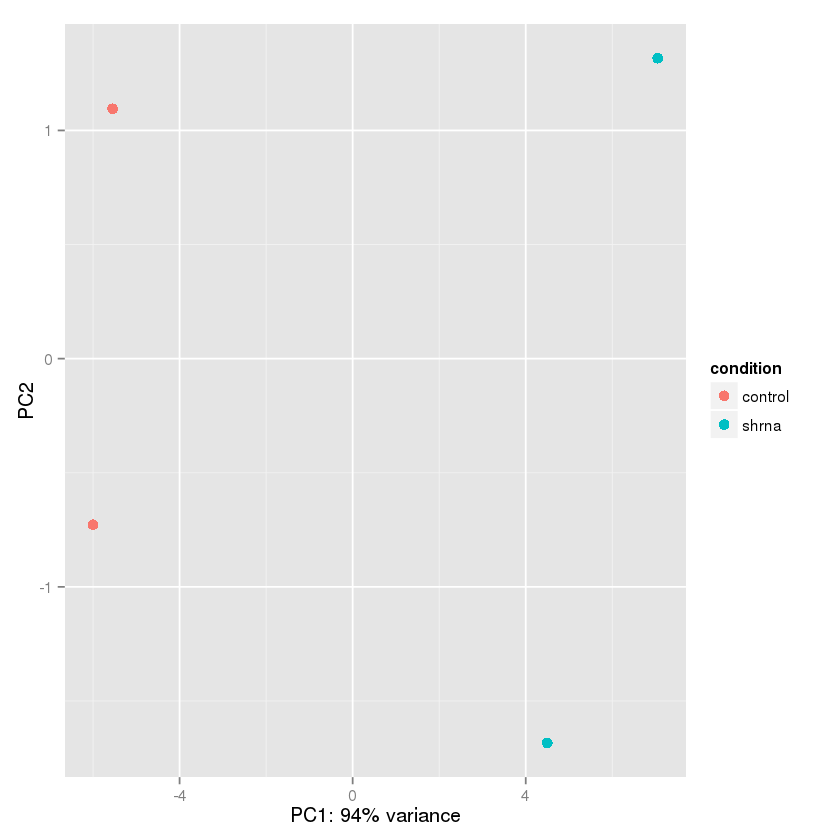

In [29]:
rld <- rlog(dds)
vsd <- varianceStabilizingTransformation(dds)

data <- plotPCA(rld, intgroup="condition", returnData=TRUE)
percentVar <- round(100 * attr(data, "percentVar"))
ggplot(data, aes(PC1, PC2, color=condition)) +
    geom_point(size=3) +
    xlab(paste0("PC1: ",percentVar[1],"% variance")) 
    ylab(paste0("PC2: ",percentVar[2],"% variance"))

Warning message:
In plot.window(...): "clustering_distance_rows" is not a graphical parameterWarning message:
In plot.window(...): "clustering_distance_cols" is not a graphical parameterWarning message:
In plot.xy(xy, type, ...): "clustering_distance_rows" is not a graphical parameterWarning message:
In plot.xy(xy, type, ...): "clustering_distance_cols" is not a graphical parameterWarning message:
In title(...): "clustering_distance_rows" is not a graphical parameterWarning message:
In title(...): "clustering_distance_cols" is not a graphical parameter

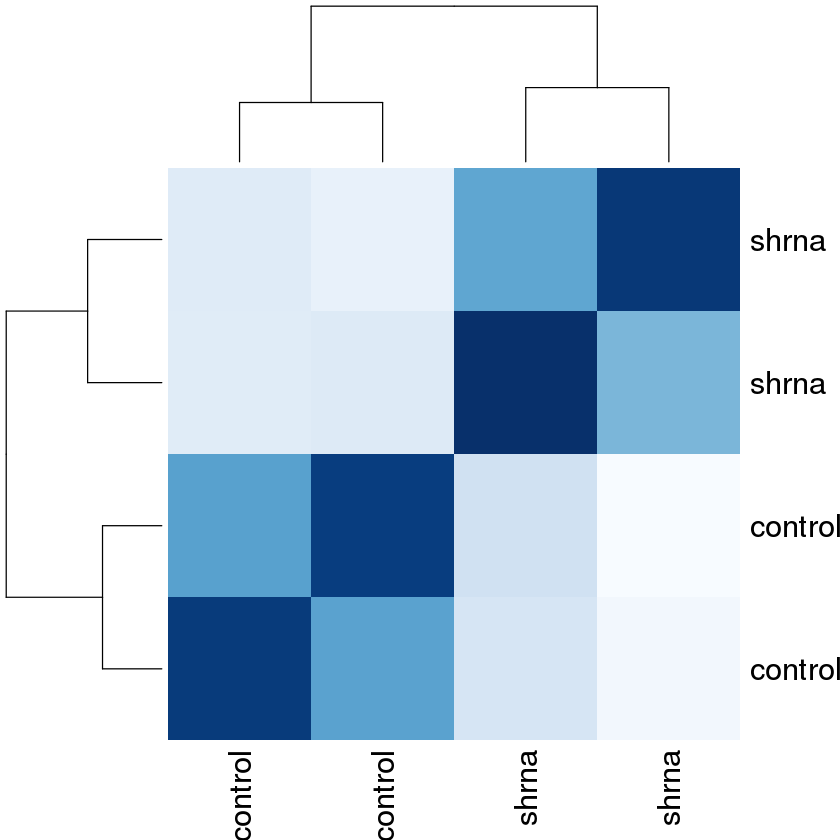

In [30]:
sampleDists <- dist(t(assay(rld)))


sampleDistMatrix <- as.matrix(sampleDists)

rownames(sampleDistMatrix) <- paste(rld$condition)

colnames(sampleDistMatrix) <- paste(rld$condition)

colors <- colorRampPalette( rev(brewer.pal(9, "Blues")) )(255)

heatmap(sampleDistMatrix,
clustering_distance_rows=sampleDists,
clustering_distance_cols=sampleDists,
col=colors)